In [1]:
import torch
import numpy as np
import os
import gc
import random
import cv2 as cv
import torchvision.models as models
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image

import dataloader

Auto-reload files imported to the notebook

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', device)

Device: cuda


In [4]:
TILE_HEIGHT, TILE_WIDTH = 80, 80

For torch dataloader to use num_workers > 0, it relies on python multiprocessing, which in windows have deadlock issues, unless the instantiation is in a .py module and the code that invokes it is wrapped inside a \__main__ section.
https://github.com/pytorch/pytorch/issues/51344

In [5]:
if __name__ == '__main__':
    loader_train, loader_val, loader_test = dataloader.main(TILE_HEIGHT, TILE_WIDTH, batch_size=10, num_workers=3)

This method is used to plot single-channel tiles together.

In [5]:
def plot_tiles(img, num_tiles_v, num_tiles_h, channel=None):
    if channel != None:
        img = img[channel]      
    v, h = num_tiles_v, num_tiles_h 
    if v == h == 1:
        print(img.shape)
        plt.imshow(np.absolute(img.squeeze()))
        plt.axis('off')
        plt.show()
    else:
        fig, axs = plt.subplots(v, h) 
        for i in range(v):
            for j in range(h):
                # absolute is used because plt.imshow has odd habit of showing -0.0 as bright blocks
                axs[i,j].imshow(np.absolute(img[i*h+j]))
                axs[i,j].axis('off')
        plt.subplots_adjust(wspace=0.05, hspace=0.05)

In [6]:
# x, y = next(iter(loader_train))
# x, y = x[0], y[0]
# print('data size:', x.shape)
# v, h = int(480/TILE_HEIGHT), int(640/TILE_WIDTH)
# for c in range(3):
#     plot_tiles(x, v, h, c)
#     plot_tiles(y, v, h, c)
#     plot_tiles(x*y, v, h, c)

Here we import the resnet18 model with pretrained weights. This gives us some good starting weights so that we don't have to train the model from scratch. From there, we replace the last layer to work with the tiles format rather than resnet18's standard classification. Lastly, we freeze all of the layers except for the newly added layer so that it can be trained individually

In [7]:
def get_acc(predictions, labels):
    return torch.sum(predictions == labels)/(labels.shape[0]*labels.shape[1])

def get_recall(predictions, labels):
    return torch.sum((predictions == labels) * (labels == 1))/torch.sum(labels == 1)

def get_precision(predictions, labels):
    return torch.sum((predictions == labels) * (labels == 1))/torch.sum(predictions == 1)

This function is used to train the model

Reference: pytorch official tutorial (https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html)

In [8]:
def train(model, loader_train, loader_val, lr=1e-4, num_epochs=10, device='cpu', patience=5, evaluation_interval=200):
    # initialize lists to store logs of the validation loss and validation accuracy
    val_loss_hist = []
    val_acc_hist = []
    
    # initialize optimizer with specified learning rate
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    
    # From documentation: This loss combines a Sigmoid layer and the BCELoss in one single class.
    if weight:
        loss_fn=nn.BCEWithLogitsLoss(pos_weight=torch.Tensor(weight).to(device))
    else:
        loss_fn=nn.BCEWithLogitsLoss()
    
    # early-stopping parameters
    param_hist = []
    best_n_loss = None
    current_patience = patience
    # the number of training steps between evaluations
    stop_early = False
    
    for e in range(num_epochs):
        # set model to training mode
        model.train()
        # current batch index
        batch_num, num_batches = 0, len(loader_train)
        batch_acc_train = []
        batch_loss_train = []
        batch_recall_train = []
        batch_precision_train = []
        
        # Training pass
        for X_batch, y_batch in loader_train:
            # combine the batch and tile dimension
            X_batch = X_batch.reshape(-1, X_batch.shape[1], X_batch.shape[3], X_batch.shape[4])
            # add a dimension to match prediction shape
            # only take the first color channel of mask
            y_batch = y_batch[:,0,:,:,:].reshape(-1, y_batch.shape[-2] * y_batch.shape[-1])
            
            # torch tensor can be loaded to GPU, when applicable
            X_batch, y_batch = X_batch.float().to(device), y_batch.to(device)
            
            # reset gradients for the optimizer, need to be done each training step
            optimizer.zero_grad()
            
            # output here is logit (before passing through sigmoid)
            output = model(X_batch)
            # class=1 if logit > 0 is equivalent to class=1 if sigmoid(logit) > 0.5
            predictions = torch.where(output > 0, 1, 0)
            # loss_fn here is BCEWithLogitsLoss, which again includes the sigmoid layer
            batch_loss = loss_fn(output, y_batch.float())
            # compute the gradients and take optimization step
            batch_loss.backward()
            optimizer.step()
            
            batch_acc = get_acc(predictions, y_batch)
            batch_recall = get_recall(predictions, y_batch)
            batch_precision = get_precision(predictions, y_batch)
            
            batch_acc_train.append(batch_acc.item())
            batch_loss_train.append(batch_loss.item())
            batch_recall_train.append(batch_recall.item())
            batch_precision_train.append(batch_precision.item())
            
            # running average
            avg_train_acc = np.mean(batch_acc_train)
            avg_train_loss = np.mean(batch_loss_train)
            avg_train_recall = np.mean(batch_recall_train)
            avg_train_precision = np.mean(batch_precision_train)
            
            print('Training epoch %d batch %d/%d, train loss = %f, train acc = %f, recall = %f, precision = %f' 
                      %(e+1, batch_num+1, num_batches, avg_train_loss, 
                        avg_train_acc, avg_train_recall, avg_train_precision), end='\r')
            
            batch_num += 1
            
            if batch_num % 20 == 0:
                del X_batch
                del y_batch
                torch.cuda.empty_cache()
                gc.collect()
            
            if not evaluation_interval:
                evaluation_interval = num_batches//2
            
            # evaluate on validation set every 100 epochs, invoke early-stopping as needed (with patience)
            if batch_num % evaluation_interval == 0 or batch_num == num_batches:
                
                # evaluate the model
                print()
                total_loss_val, total_acc_val, total_recall_val, total_precision_val = evaluate_model(model, loader_val, loss_fn, device)
                
                print('validation metrics at epoch %d batch %d: val loss = %f, val acc = %f, val recall = %f, val precision = %f' 
                      %(e+1, batch_num, total_loss_val, total_acc_val, total_recall_val, total_precision_val))
                
                val_loss_hist.append(total_loss_val)
                val_acc_hist.append(total_acc_val)
                
                # early stopping with patience
                save_path = 'epoch_%d_batch_%d.model' %(e, batch_num)
                torch.save(model.state_dict(), save_path)
                param_hist.append(save_path)
                # only need to keep weights needed for earlystopping
                if len(param_hist) > patience+1:
                    del_path = param_hist.pop(0)
                    os.remove(del_path) # delete unnecessary state dicts
                if best_n_loss and total_loss_val >= best_n_loss:
                    current_patience -= 1
                    print('current_patience = %d' %current_patience)
                    if current_patience == 0: 
                        print('\nstopping early after no validation accuracy improvement in %d steps' 
                              % (patience * evaluation_interval))
                        best_weights_path = param_hist[-(patience+1)]
                        # restore to last best weights when stopping early
                        model.load_state_dict(torch.load(best_weights_path))
                        stop_early = True
                        break

                # if performance improves, reset patience and best accuracy
                else:
                    current_patience = patience
                    best_n_loss = total_loss_val
                        
        if stop_early:
            break
            
        # get epoch-wide training metrics
        epoch_loss_train = np.mean(batch_loss_train)
        epoch_acc_train = np.mean(batch_acc_train)
            
        print('='*80+'\nEpoch %d/%d train loss = %f, train acc = %f, val loss = %f, val acc = %f' 
              % (e+1, num_epochs, epoch_loss_train, epoch_acc_train, total_loss_val, total_acc_val))
        
    if device == 'cuda':
        torch.cuda.empty_cache() # free gpu memory if loaded to cuda
    else:
        gc.collect() # free memory if not using cuda
            
    # remove cached weights after stopping and loading best weights (if applicable) 
    cached_weight_paths = [f for f in os.listdir('.') if ('epoch' in f and '.model' in f)]
    for p in cached_weight_paths:
        os.remove(p)
    
    return (val_loss_hist, val_acc_hist)

In [9]:
def get_inference_output(model, X_in, device):
    model.eval()
    X_in = X_in.to(device)
    with torch.no_grad():
        output = model(X_in.float())
    return output

In [10]:
def evaluate_model(model, loader_val, loss_fn, device):
    acc_val = []
    loss_val = []
    recall_val = []
    precision_val = []
    err_x, err_y, err_pred = np.array([]), np.array([]), np.array([])
    val_batch_num, val_num_batches = 0, len(loader_val)
    # set model to eval mode when evaluating on validation set
    model.eval()
    for X_val, y_val in loader_val:
        # combine the batch and tile dimension
        X_val = X_val.reshape(-1, X_val.shape[1], X_val.shape[3], X_val.shape[4])
        # add a dimension to match prediction shape
        # only take the first color channel of mask
        y_val = y_val[:,0,:,:,:].reshape(-1, y_val.shape[-2] * y_val.shape[-1])
        X_val, y_val = X_val.to(device), y_val.to(device)
        
        with torch.no_grad():
            # output here is logit (before passing through sigmoid)
            output = get_inference_output(model, X_val, device)
            # class=1 if logit > 0 is equivalent to class=1 if sigmoid(logit) > 0.5
            predictions = torch.where(output > 0, 1, 0)
            batch_loss = loss_fn(output, y_val.float())
            
        batch_acc = get_acc(predictions, y_val)
        batch_recall = get_recall(predictions, y_val)
        batch_precision = get_precision(predictions, y_val)
        
        acc_val.append(batch_acc.item())
        loss_val.append(batch_loss.item())
        recall_val.append(batch_recall.item())
        precision_val.append(batch_precision.item())
        
        print('evaluating batch %d/%d'%(val_batch_num+1, val_num_batches), end='\r')
        val_batch_num += 1  
        
    del X_val
    del y_val
    torch.cuda.empty_cache()
    gc.collect()    

    # get validation metrics for this epoch
    total_acc_val = np.mean(acc_val)
    total_loss_val = np.mean(loss_val)
    total_recall_val = np.mean(recall_val)
    total_precision_val = np.mean(precision_val)
    # set model back to training mode after finishing evaluation
    model.train()
    
    return (total_loss_val, total_acc_val, total_recall_val, total_precision_val)

In [14]:
def visualize_model_output(dataloader, model, num, TILE_HEIGHT=TILE_HEIGHT, TILE_WIDTH=TILE_WIDTH, device='cuda'):
    while num > 0:
        x, y = next(iter(dataloader))
        print(x.shape, y.shape)
        batchsize = x.shape[0]
        x_out = get_inference_output(model, x.reshape(-1, x.shape[1], x.shape[3], x.shape[4]), device)
        x_out = torch.where(x_out > 0, 1, 0).cpu()
        y_reshape = y[:,0,:,:,:].reshape(-1, y.shape[-2] * y.shape[-1]).cpu()
        print(get_acc(x_out, y_reshape), get_precision(x_out, y_reshape), get_recall(x_out, y_reshape))
        x_out_reshaped = x_out.reshape(-1, y.shape[2], y.shape[3], y.shape[4]).cpu()

        v, h = int(480/TILE_HEIGHT), int(640/TILE_WIDTH)
        for i in range(min(num, batchsize)):
            plot_tiles(x[i], v, h, 0)
            plot_tiles(x_out_reshaped[i], v, h)
            plot_tiles(y[i], v, h, 0)

        num -= min(num, batchsize)

In [12]:
# Free cuda memory
# Reference: https://discuss.pytorch.org/t/how-to-debug-causes-of-gpu-memory-leaks/6741/13
def freemem():
    for obj in gc.get_objects():
        if torch.is_tensor(obj) and torch.is_tensor(obj.data):
            del obj
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

In [12]:
mobilenet = models.mobilenet_v2(pretrained=True)
# replace last layer
mobilenet.classifier[-1] = nn.Linear(1280, TILE_HEIGHT*TILE_WIDTH)
print(mobilenet.classifier)
for param in mobilenet.parameters():
    param.require_grad = False
mobilenet.classifier[-1].requires_grad_(True)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', device)
mobilenet = mobilenet.to(device)
train(mobilenet, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)

Sequential(
  (0): Dropout(p=0.2, inplace=False)
  (1): Linear(in_features=1280, out_features=6400, bias=True)
)
Device: cuda
Training epoch 1 batch 150/300, train loss = 0.127694, train acc = 0.968993, recall = 0.022585, precision = nan2979
validation metrics at epoch 1 batch 150: val loss = 0.042749, val acc = 0.990552, val recall = 0.000000, val precision = nan
Training epoch 1 batch 300/300, train loss = 0.084490, train acc = 0.979771, recall = 0.011293, precision = nan
validation metrics at epoch 1 batch 300: val loss = 0.038003, val acc = 0.990552, val recall = 0.000000, val precision = nan
Epoch 1/100 train loss = 0.084490, train acc = 0.979771, val loss = 0.038003, val acc = 0.990552
Training epoch 2 batch 150/300, train loss = 0.038420, train acc = 0.990634, recall = 0.000000, precision = nan
validation metrics at epoch 2 batch 150: val loss = 0.035272, val acc = 0.990552, val recall = 0.000000, val precision = nan
Training epoch 2 batch 300/300, train loss = 0.037953, train a

([0.04274909071624279,
  0.038003421425819396,
  0.03527215950191021,
  0.03419182769954204,
  0.03460575770586729,
  0.03354731909930706,
  0.03365275196731091,
  0.033559494763612745,
  0.03323185410350561,
  0.03260622713714838,
  0.03210228033363819,
  0.03233086977154016,
  0.03279522206634283,
  0.030929395146667957,
  0.03067174568772316,
  0.030313806049525736,
  0.029622794538736345,
  0.030370976999402045,
  0.029240204617381096,
  0.028343897238373758,
  0.028208982460200788,
  0.02831011202186346,
  0.02860638316720724,
  0.027431771270930768,
  0.027667069882154463,
  0.028283070251345636,
  0.02768296781927347,
  0.027141194567084314,
  0.02712827183306217,
  0.02704489476978779,
  0.027105893939733505,
  0.02726615149527788,
  0.027298237904906274,
  0.027346060834825037,
  0.02715714506804943,
  0.027219255827367304,
  0.026984601616859435,
  0.02751755803823471,
  0.02693226043134928,
  0.026918299570679663,
  0.027504535764455794,
  0.026693597473204135,
  0.027112167

In [18]:
for param in mobilenet.parameters():
    param.require_grad = True
train(mobilenet, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)

torch.save(mobilenet.state_dict(), 'saved_models/mobilenet.model')

Training epoch 1 batch 150/300, train loss = 0.022398, train acc = 0.991984, recall = 0.268441, precision = 0.680235
validation metrics at epoch 1 batch 150: val loss = 0.026818, val acc = 0.991151, val recall = 0.198995, val precision = 0.587663
Training epoch 1 batch 300/300, train loss = 0.022447, train acc = 0.991871, recall = 0.272744, precision = 0.669582
validation metrics at epoch 1 batch 300: val loss = 0.027160, val acc = 0.991023, val recall = 0.237719, val precision = 0.555245
current_patience = 9
Epoch 1/100 train loss = 0.022447, train acc = 0.991871, val loss = 0.027160, val acc = 0.991023
Training epoch 2 batch 150/300, train loss = 0.021685, train acc = 0.992127, recall = 0.275347, precision = 0.682170
validation metrics at epoch 2 batch 150: val loss = 0.027139, val acc = 0.990469, val recall = 0.293604, val precision = 0.489054
current_patience = 8
Training epoch 2 batch 300/300, train loss = 0.022121, train acc = 0.992022, recall = 0.283036, precision = 0.684643
val

([0.02681813485920429,
  0.027160032615065575,
  0.02713856615126133,
  0.026610926911234855,
  0.026533921994268895,
  0.026243202947080137,
  0.026591709330677987,
  0.026186857335269452,
  0.027262344174087048,
  0.02699666704982519,
  0.027012421227991582,
  0.026575788371264935,
  0.027787906117737293,
  0.027210327237844466,
  0.026790320053696633,
  0.02694450818002224,
  0.027317871786653996,
  0.026173584945499897,
  0.026822077631950377,
  0.026936701014637947,
  0.027331936284899713,
  0.026965696178376675,
  0.026821876652538778,
  0.026457601748406886,
  0.026762000881135464,
  0.026815281249582767,
  0.027647956758737564,
  0.027214638888835907],
 [0.9911505949497222,
  0.9910232031345367,
  0.9904693496227265,
  0.9911358773708343,
  0.9909319365024567,
  0.9912172901630402,
  0.9909661734104156,
  0.9911846220493317,
  0.9907194304466248,
  0.9912977480888366,
  0.9911615753173828,
  0.9908379542827607,
  0.9911326575279236,
  0.9911859083175659,
  0.991059398651123,
  

In [20]:
resnet18 = models.resnet18(pretrained=True)
# replace last layer
resnet18.fc = nn.Linear(512, TILE_HEIGHT*TILE_WIDTH)
for param in resnet18.parameters():
    param.require_grad = False
resnet18.fc.requires_grad_(True)
# resnet18.modules

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', device)
resnet18 = resnet18.to(device)
train(resnet18, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)

for param in resnet18.parameters(): 
    param.require_grad = True
train(resnet18, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)

torch.save(resnet18.state_dict(), 'saved_models/resnet18.model')

Device: cuda
Training epoch 1 batch 150/300, train loss = 0.160188, train acc = 0.955226, recall = 0.036738, precision = nan7837
validation metrics at epoch 1 batch 150: val loss = 0.047347, val acc = 0.990552, val recall = 0.000000, val precision = nan
Training epoch 1 batch 300/300, train loss = 0.102160, train acc = 0.972846, recall = 0.018369, precision = nan
validation metrics at epoch 1 batch 300: val loss = 0.038501, val acc = 0.990552, val recall = 0.000000, val precision = nan
Epoch 1/100 train loss = 0.102160, train acc = 0.972846, val loss = 0.038501, val acc = 0.990552
Training epoch 2 batch 150/300, train loss = 0.039585, train acc = 0.990578, recall = 0.000000, precision = nan
validation metrics at epoch 2 batch 150: val loss = 0.037107, val acc = 0.990552, val recall = 0.000000, val precision = nan
Training epoch 2 batch 300/300, train loss = 0.038885, train acc = 0.990579, recall = 0.000000, precision = nan
validation metrics at epoch 2 batch 300: val loss = 0.036545, v

In [30]:
# 160x160 tiles
TILE_HEIGHT, TILE_WIDTH = 160, 160
if __name__ == '__main__':
    loader_train, loader_val, loader_test = dataloader.main(TILE_HEIGHT, TILE_WIDTH, batch_size=10, num_workers=3)
    
resnet18_160 = models.resnet18(pretrained=True)
# replace last layer
resnet18_160.fc = nn.Linear(512, TILE_HEIGHT*TILE_WIDTH)
for param in resnet18_160.parameters():
    param.require_grad = False
resnet18_160.fc.requires_grad_(True)
# resnet18.modules

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', device)
resnet18_160 = resnet18_160.to(device)
train(resnet18_160, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)

for param in resnet18_160.parameters(): 
    param.require_grad = True
train(resnet18_160, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)
 
torch.save(resnet18_160.state_dict(), 'saved_models/resnet18_160.model')

Device: cuda
Training epoch 1 batch 150/300, train loss = 0.162280, train acc = 0.956637, recall = 0.034398, precision = nan8545
validation metrics at epoch 1 batch 150: val loss = 0.049494, val acc = 0.990552, val recall = 0.000000, val precision = nan
Training epoch 1 batch 300/300, train loss = 0.103641, train acc = 0.973630, recall = 0.017199, precision = nan
validation metrics at epoch 1 batch 300: val loss = 0.040150, val acc = 0.990552, val recall = 0.000000, val precision = nan
Epoch 1/100 train loss = 0.103641, train acc = 0.973630, val loss = 0.040150, val acc = 0.990552
Training epoch 2 batch 150/300, train loss = 0.039988, train acc = 0.990521, recall = 0.000000, precision = nan
validation metrics at epoch 2 batch 150: val loss = 0.035964, val acc = 0.990552, val recall = 0.000000, val precision = nan
Training epoch 2 batch 300/300, train loss = 0.038272, train acc = 0.990579, recall = 0.000001, precision = nan
validation metrics at epoch 2 batch 300: val loss = 0.033056, v

In [13]:
freemem()
# no tiling
TILE_HEIGHT, TILE_WIDTH = 480, 640
if __name__ == '__main__':
    loader_train, loader_val, loader_test = dataloader.main(TILE_HEIGHT, TILE_WIDTH, batch_size=10, num_workers=3)

resnet18_notile = models.resnet18(pretrained=True)
# replace last layer
resnet18_notile.fc = nn.Linear(512, TILE_HEIGHT*TILE_WIDTH)
for param in resnet18_notile.parameters():
    param.require_grad = False
resnet18_notile.fc.requires_grad_(True)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', device)
resnet18_notile = resnet18_notile.to(device)
train(resnet18_notile, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)

for param in resnet18_notile.parameters(): 
    param.require_grad = True
train(resnet18_notile, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)
 
torch.save(resnet18_notile.state_dict(), 'saved_models/resnet18_notile.model')

Device: cuda
Training epoch 1 batch 150/300, train loss = 0.160489, train acc = 0.958488, recall = 0.033674, precision = nan7988
validation metrics at epoch 1 batch 150: val loss = 0.047598, val acc = 0.990475, val recall = 0.000000, val precision = nan
Training epoch 1 batch 300/300, train loss = 0.101603, train acc = 0.974389, recall = 0.016837, precision = nan
validation metrics at epoch 1 batch 300: val loss = 0.039134, val acc = 0.990475, val recall = 0.000000, val precision = nan
Epoch 1/100 train loss = 0.101603, train acc = 0.974389, val loss = 0.039134, val acc = 0.990475
Training epoch 2 batch 150/300, train loss = 0.037242, train acc = 0.990464, recall = 0.000000, precision = nan
validation metrics at epoch 2 batch 150: val loss = 0.035896, val acc = 0.990475, val recall = 0.000000, val precision = nan
Training epoch 2 batch 300/300, train loss = 0.036544, train acc = 0.990480, recall = 0.000000, precision = nan
validation metrics at epoch 2 batch 300: val loss = 0.034841, v

In [13]:
freemem()
# no tiling, whole dataset (change in dataloader.py)
TILE_HEIGHT, TILE_WIDTH = 480, 640
if __name__ == '__main__':
    loader_train, loader_val, loader_test = dataloader.main(TILE_HEIGHT, TILE_WIDTH, batch_size=10, num_workers=3)

resnet18_notile_full = models.resnet18(pretrained=True)
# replace last layer
resnet18_notile_full.fc = nn.Linear(512, TILE_HEIGHT*TILE_WIDTH)
for param in resnet18_notile_full.parameters():
    param.require_grad = False
resnet18_notile_full.fc.requires_grad_(True)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', device)
resnet18_notile_full = resnet18_notile_full.to(device)
train(resnet18_notile_full, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)

for param in resnet18_notile_full.parameters(): 
    param.require_grad = True
train(resnet18_notile_full, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)
 
torch.save(resnet18_notile_full.state_dict(), 'saved_models/resnet18_notile_full.model')

c:\users\gorde\appdata\local\programs\python\python39\lib\site-packages\torch\distributed\distributed_c10d.py:144: UserWarning: torch.distributed.reduce_op is deprecated, please use torch.distributed.ReduceOp instead
  warnings.warn("torch.distributed.reduce_op is deprecated, please use "


Device: cuda
Training epoch 1 batch 1250/2500, train loss = 0.049541, train acc = 0.986707, recall = 0.023040, precision = nan510
validation metrics at epoch 1 batch 1250: val loss = 0.024643, val acc = 0.991821, val recall = 0.177824, val precision = nan
Training epoch 1 batch 2500/2500, train loss = 0.034655, train acc = 0.989718, recall = 0.179994, precision = nan
validation metrics at epoch 1 batch 2500: val loss = 0.014464, val acc = 0.994399, val recall = 0.577598, val precision = 0.783423
Epoch 1/100 train loss = 0.034655, train acc = 0.989718, val loss = 0.014464, val acc = 0.994399
Training epoch 2 batch 1250/2500, train loss = 0.014654, train acc = 0.994009, recall = 0.512380, precision = 0.786188
validation metrics at epoch 2 batch 1250: val loss = 0.010890, val acc = 0.995421, val recall = 0.680229, val precision = 0.821052
Training epoch 2 batch 2500/2500, train loss = 0.013186, train acc = 0.994440, recall = 0.570543, precision = 0.795615
validation metrics at epoch 2 bat

torch.Size([10, 3, 1, 480, 640]) torch.Size([10, 3, 1, 480, 640])
tensor(0.9978) tensor(0.8664) tensor(0.8867)
torch.Size([1, 480, 640])


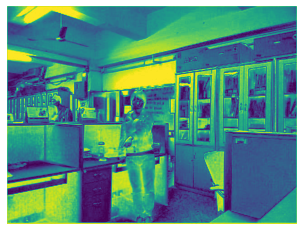

torch.Size([1, 480, 640])


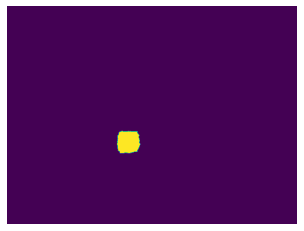

torch.Size([1, 480, 640])


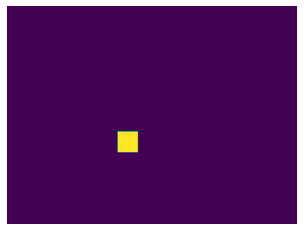

torch.Size([1, 480, 640])


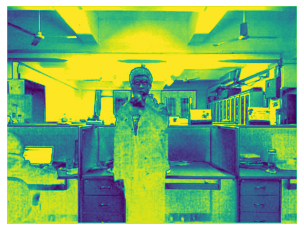

torch.Size([1, 480, 640])


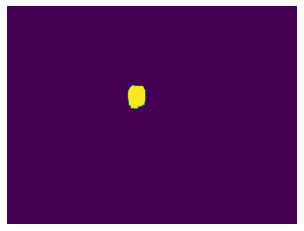

torch.Size([1, 480, 640])


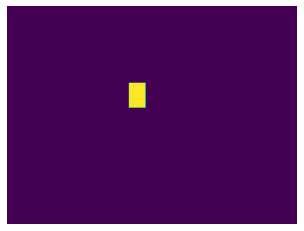

torch.Size([1, 480, 640])


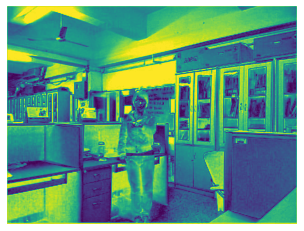

torch.Size([1, 480, 640])


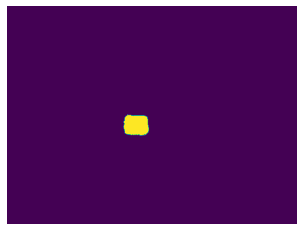

torch.Size([1, 480, 640])


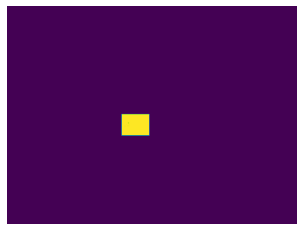

torch.Size([1, 480, 640])


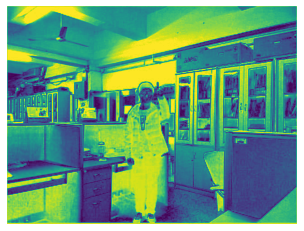

torch.Size([1, 480, 640])


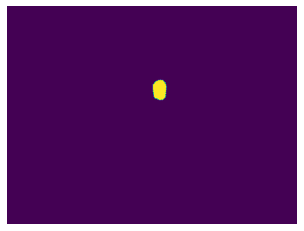

torch.Size([1, 480, 640])


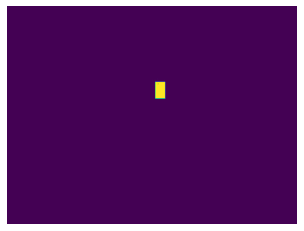

torch.Size([1, 480, 640])


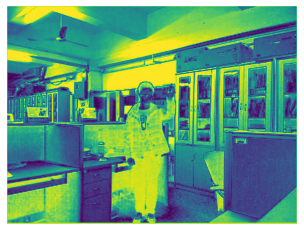

torch.Size([1, 480, 640])


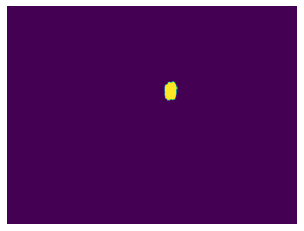

torch.Size([1, 480, 640])


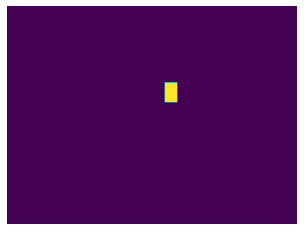

torch.Size([1, 480, 640])


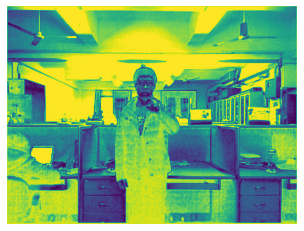

torch.Size([1, 480, 640])


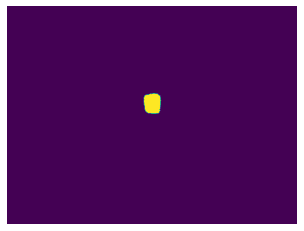

torch.Size([1, 480, 640])


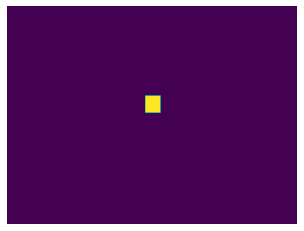

torch.Size([1, 480, 640])


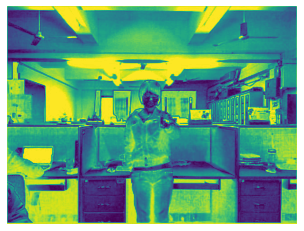

torch.Size([1, 480, 640])


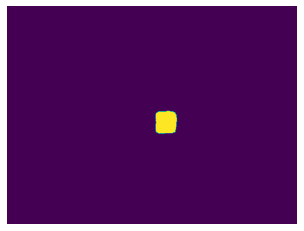

torch.Size([1, 480, 640])


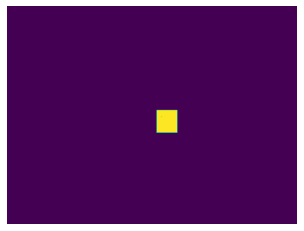

torch.Size([1, 480, 640])


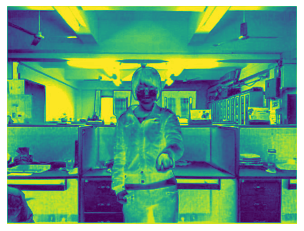

torch.Size([1, 480, 640])


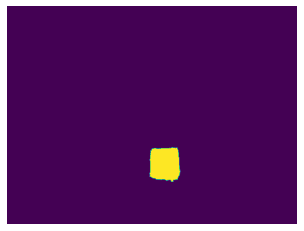

torch.Size([1, 480, 640])


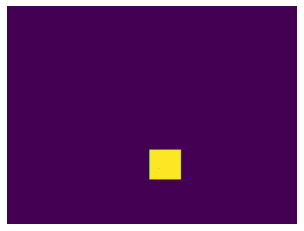

torch.Size([1, 480, 640])


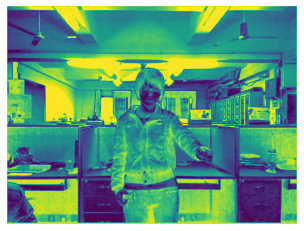

torch.Size([1, 480, 640])


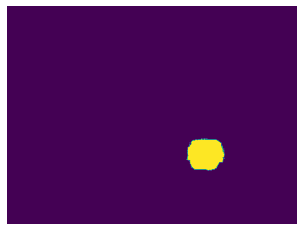

torch.Size([1, 480, 640])


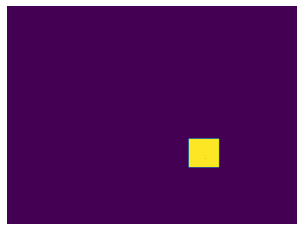

torch.Size([1, 480, 640])


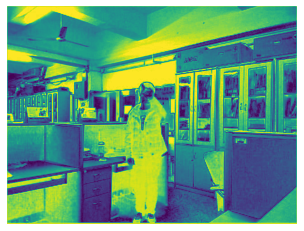

torch.Size([1, 480, 640])


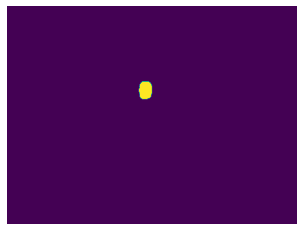

torch.Size([1, 480, 640])


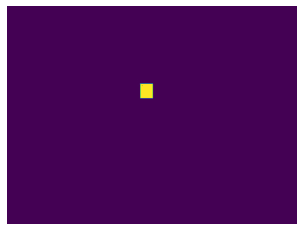

torch.Size([10, 3, 1, 480, 640]) torch.Size([10, 3, 1, 480, 640])
tensor(0.9978) tensor(0.8664) tensor(0.8867)
torch.Size([1, 480, 640])


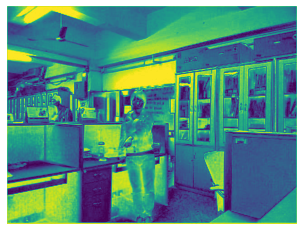

torch.Size([1, 480, 640])


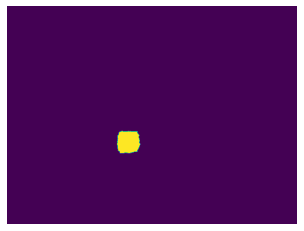

torch.Size([1, 480, 640])


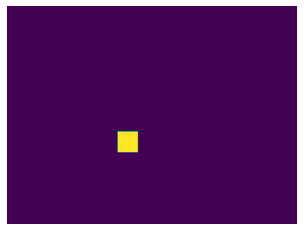

torch.Size([1, 480, 640])


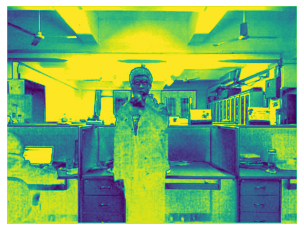

torch.Size([1, 480, 640])


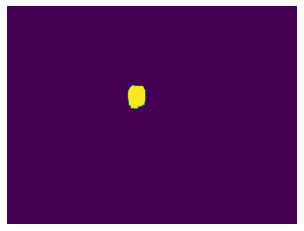

torch.Size([1, 480, 640])


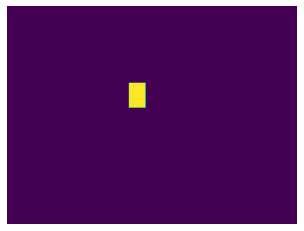

torch.Size([1, 480, 640])


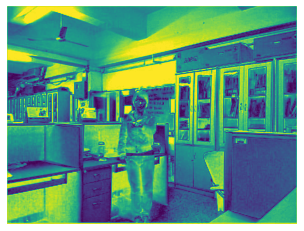

torch.Size([1, 480, 640])


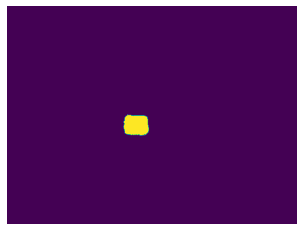

torch.Size([1, 480, 640])


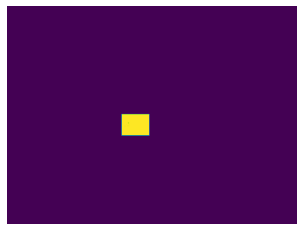

torch.Size([1, 480, 640])


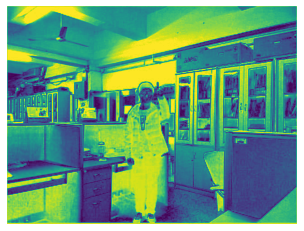

torch.Size([1, 480, 640])


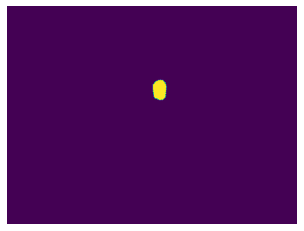

torch.Size([1, 480, 640])


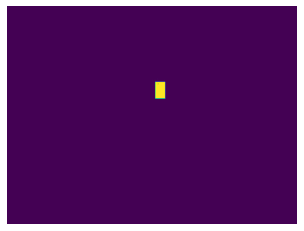

torch.Size([1, 480, 640])


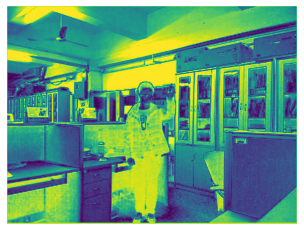

torch.Size([1, 480, 640])


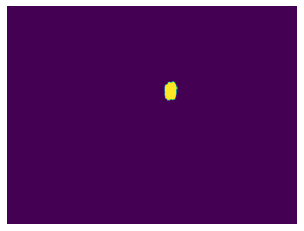

torch.Size([1, 480, 640])


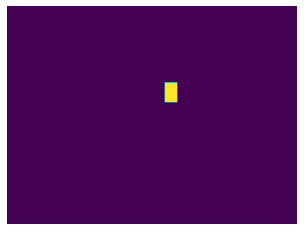

torch.Size([1, 480, 640])


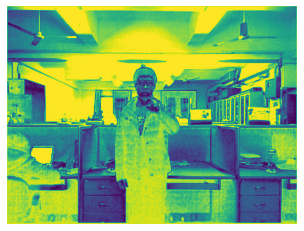

torch.Size([1, 480, 640])


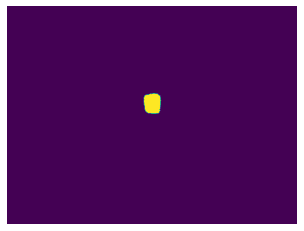

torch.Size([1, 480, 640])


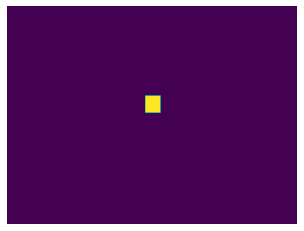

torch.Size([1, 480, 640])


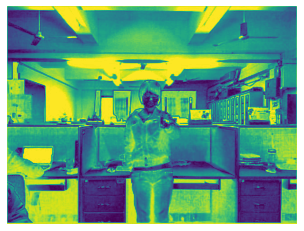

torch.Size([1, 480, 640])


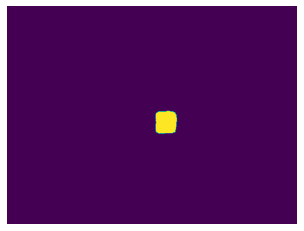

torch.Size([1, 480, 640])


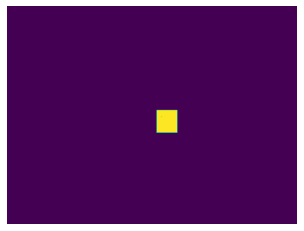

torch.Size([1, 480, 640])


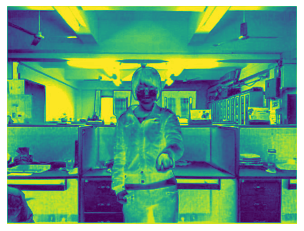

torch.Size([1, 480, 640])


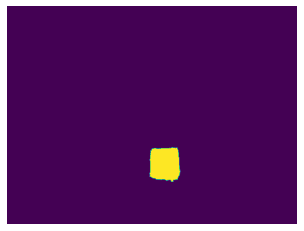

torch.Size([1, 480, 640])


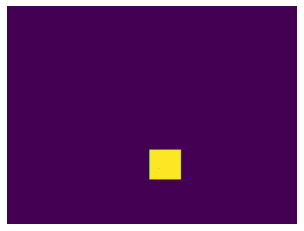

torch.Size([1, 480, 640])


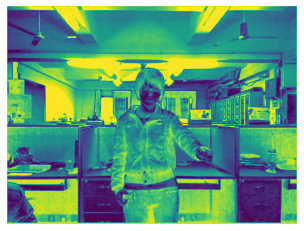

torch.Size([1, 480, 640])


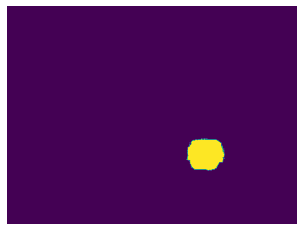

torch.Size([1, 480, 640])


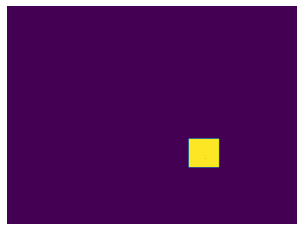

torch.Size([1, 480, 640])


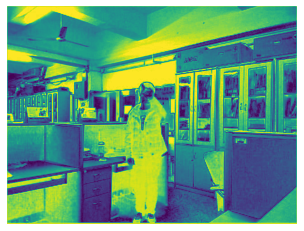

torch.Size([1, 480, 640])


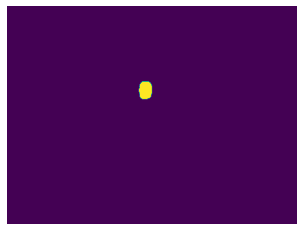

torch.Size([1, 480, 640])


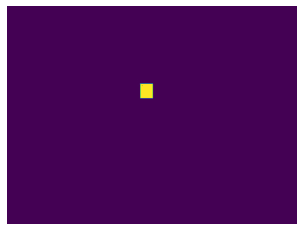

torch.Size([10, 3, 1, 480, 640]) torch.Size([10, 3, 1, 480, 640])
tensor(0.9978) tensor(0.8664) tensor(0.8867)
torch.Size([1, 480, 640])


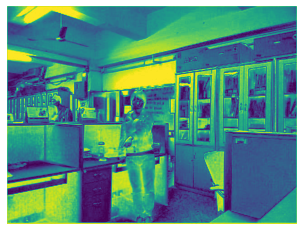

torch.Size([1, 480, 640])


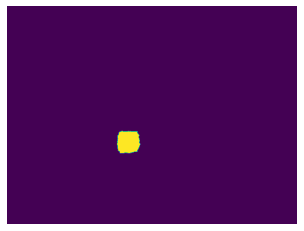

torch.Size([1, 480, 640])


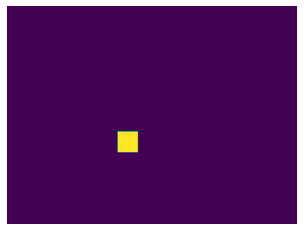

torch.Size([1, 480, 640])


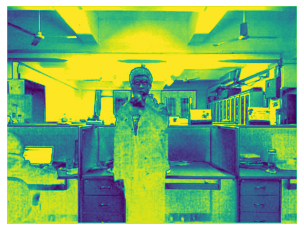

torch.Size([1, 480, 640])


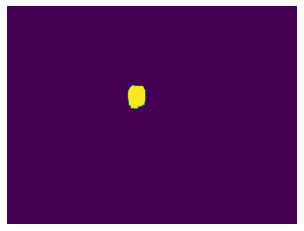

torch.Size([1, 480, 640])


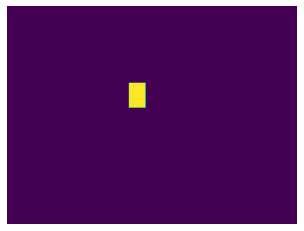

torch.Size([1, 480, 640])


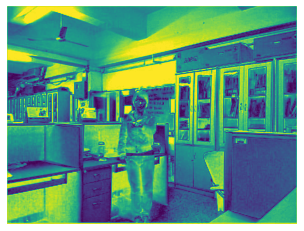

torch.Size([1, 480, 640])


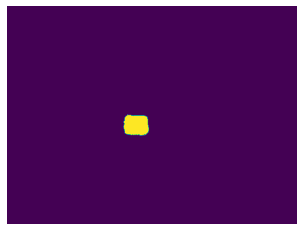

torch.Size([1, 480, 640])


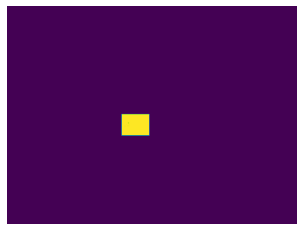

torch.Size([1, 480, 640])


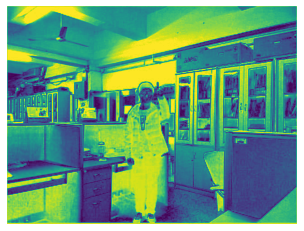

torch.Size([1, 480, 640])


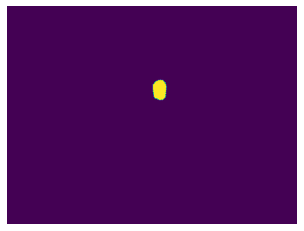

torch.Size([1, 480, 640])


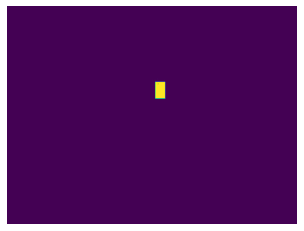

torch.Size([1, 480, 640])


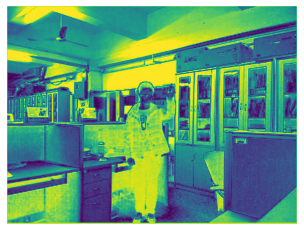

torch.Size([1, 480, 640])


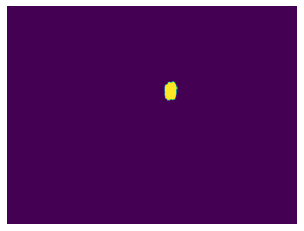

torch.Size([1, 480, 640])


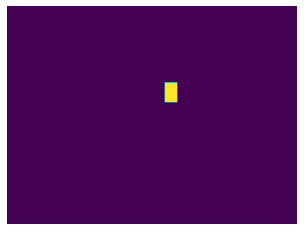

torch.Size([1, 480, 640])


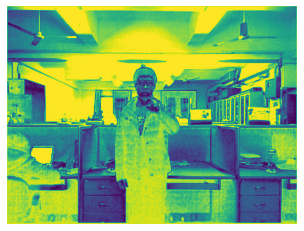

torch.Size([1, 480, 640])


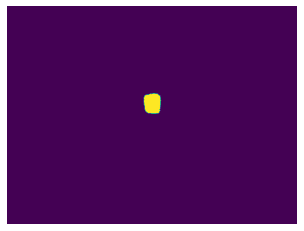

torch.Size([1, 480, 640])


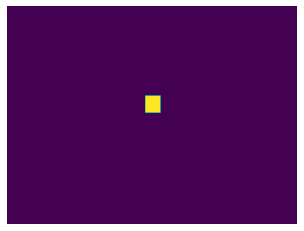

torch.Size([1, 480, 640])


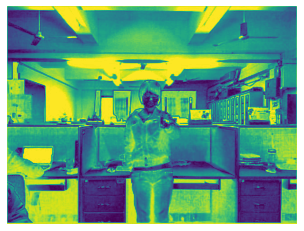

torch.Size([1, 480, 640])


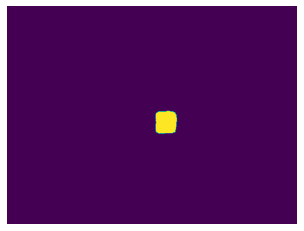

torch.Size([1, 480, 640])


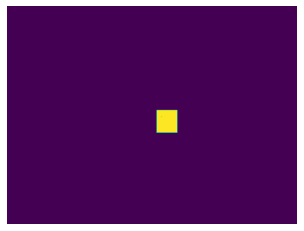

torch.Size([1, 480, 640])


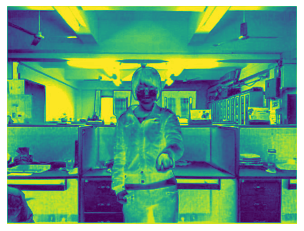

torch.Size([1, 480, 640])


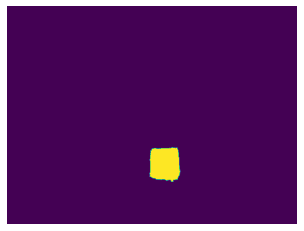

torch.Size([1, 480, 640])


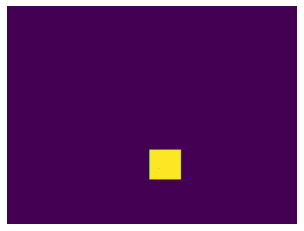

torch.Size([1, 480, 640])


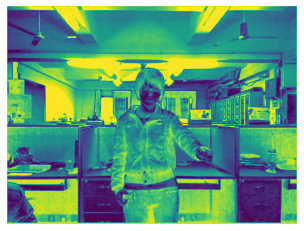

torch.Size([1, 480, 640])


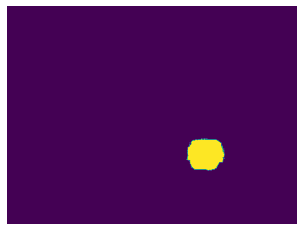

torch.Size([1, 480, 640])


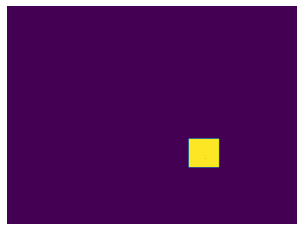

torch.Size([1, 480, 640])


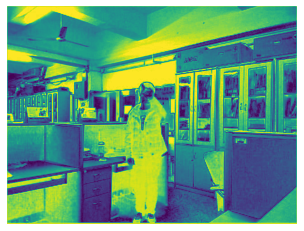

torch.Size([1, 480, 640])


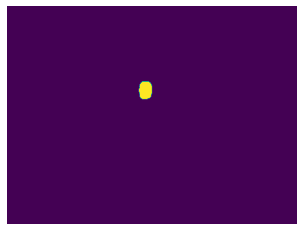

torch.Size([1, 480, 640])


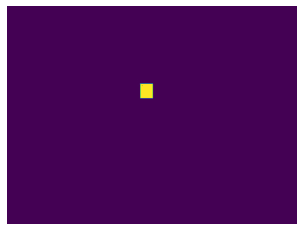

In [16]:
visualize_model_output(loader_test, resnet18_notile_full, 30, TILE_HEIGHT=480, TILE_WIDTH=640, device='cuda')

torch.Size([10, 3, 1, 480, 640]) torch.Size([10, 3, 1, 480, 640])
tensor(0.9961) tensor(0.7861) tensor(0.8781)
torch.Size([1, 480, 640])


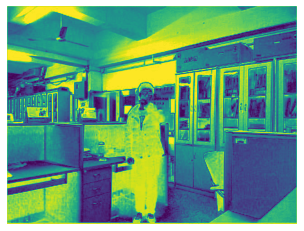

torch.Size([1, 480, 640])


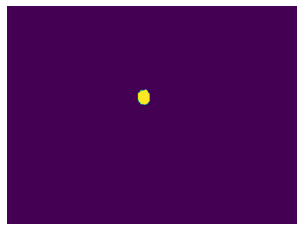

torch.Size([1, 480, 640])


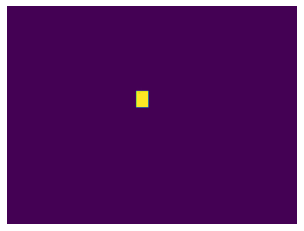

torch.Size([1, 480, 640])


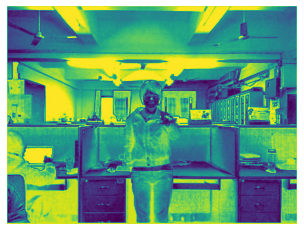

torch.Size([1, 480, 640])


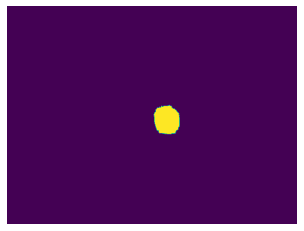

torch.Size([1, 480, 640])


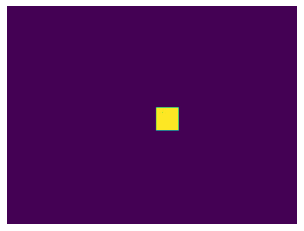

torch.Size([1, 480, 640])


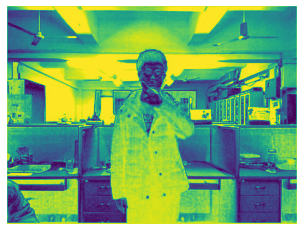

torch.Size([1, 480, 640])


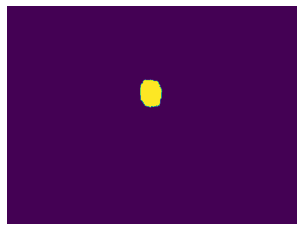

torch.Size([1, 480, 640])


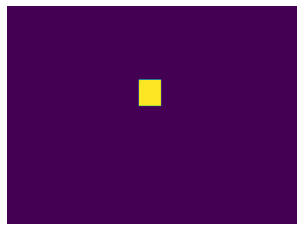

torch.Size([1, 480, 640])


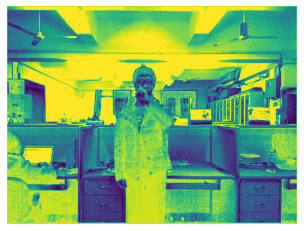

torch.Size([1, 480, 640])


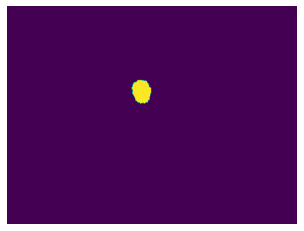

torch.Size([1, 480, 640])


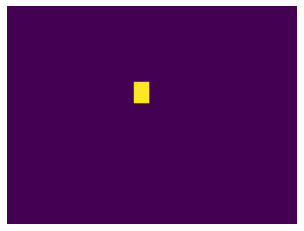

torch.Size([1, 480, 640])


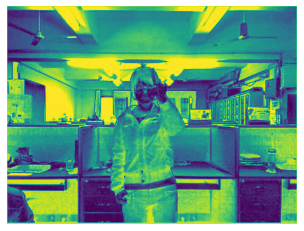

torch.Size([1, 480, 640])


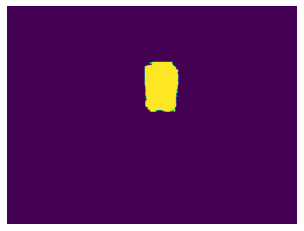

torch.Size([1, 480, 640])


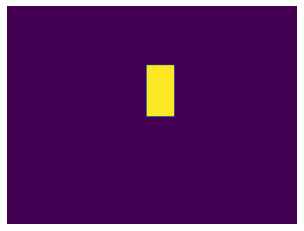

torch.Size([1, 480, 640])


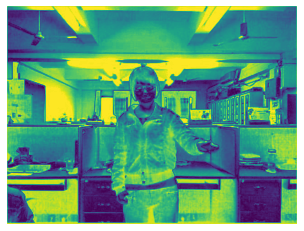

torch.Size([1, 480, 640])


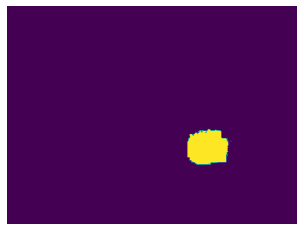

torch.Size([1, 480, 640])


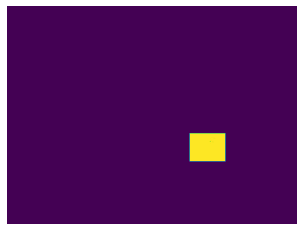

torch.Size([1, 480, 640])


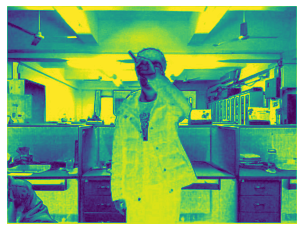

torch.Size([1, 480, 640])


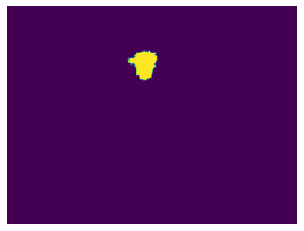

torch.Size([1, 480, 640])


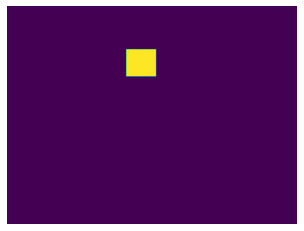

torch.Size([1, 480, 640])


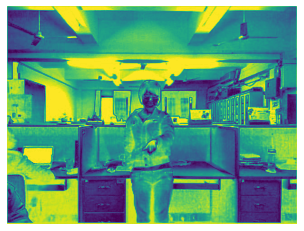

torch.Size([1, 480, 640])


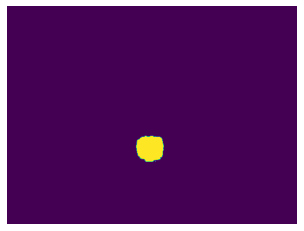

torch.Size([1, 480, 640])


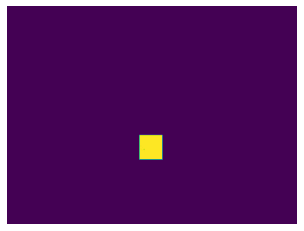

torch.Size([1, 480, 640])


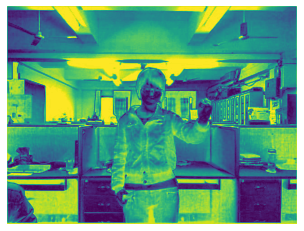

torch.Size([1, 480, 640])


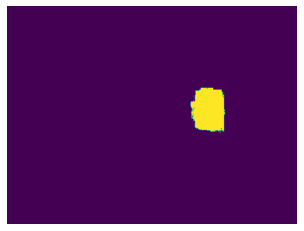

torch.Size([1, 480, 640])


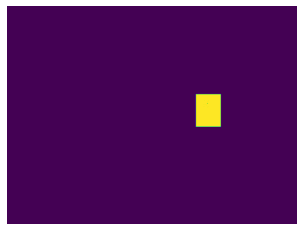

torch.Size([1, 480, 640])


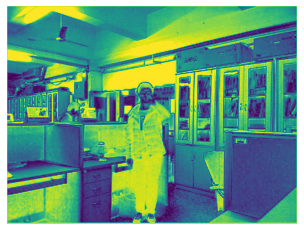

torch.Size([1, 480, 640])


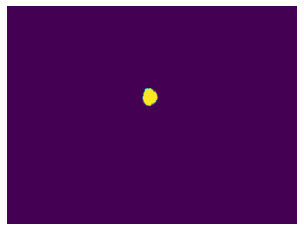

torch.Size([1, 480, 640])


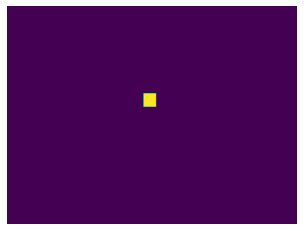

In [42]:
visualize_model_output(loader_test, resnet18_notile, 10, TILE_HEIGHT=480, TILE_WIDTH=640, device='cuda')

torch.Size([10, 3, 12, 160, 160]) torch.Size([10, 3, 12, 160, 160])
tensor(0.9954) tensor(0.5825) tensor(0.7774)


C:\Users\gorde\AppData\Local\Temp/ipykernel_8208/2167702001.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(v, h)


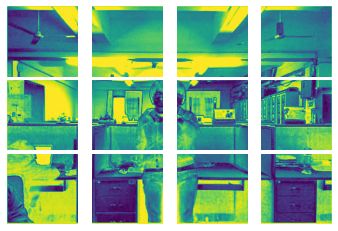

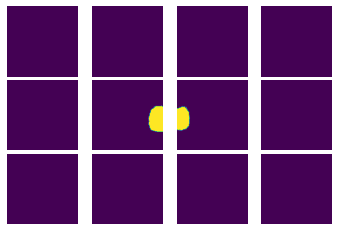

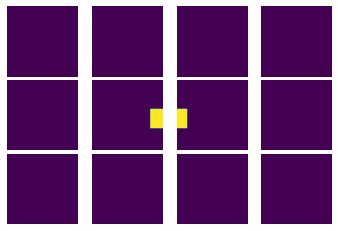

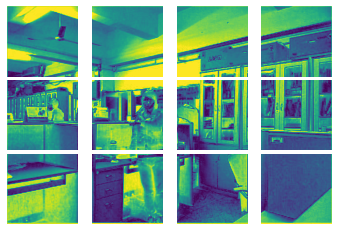

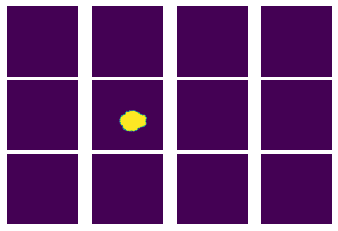

...

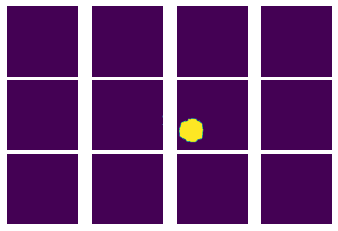

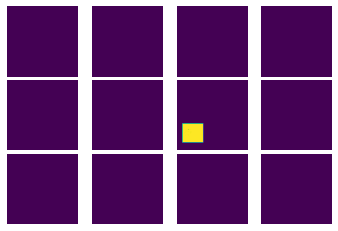

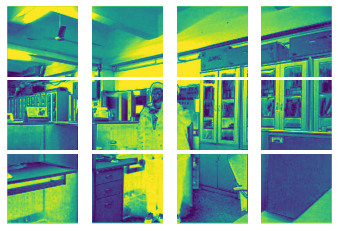

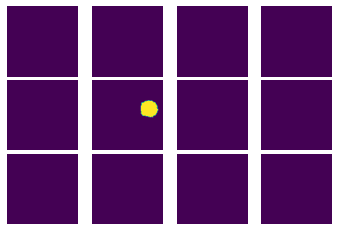

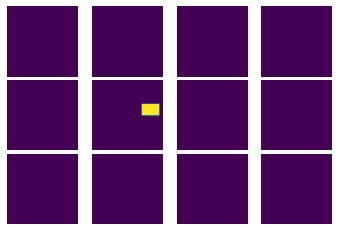

In [32]:
visualize_model_output(loader_test, resnet18_160, 10, TILE_HEIGHT=160, TILE_WIDTH=160, device='cuda')

In [14]:
# resnet101 = models.resnet101(pretrained=True)
# # replace last layer
# resnet101.fc = nn.Linear(2048, TILE_HEIGHT*TILE_WIDTH)
# for param in resnet101.parameters():
#     param.require_grad = False
# resnet101.fc.requires_grad_(True)

# device = 'cuda' if torch.cuda.is_available() else 'cpu'
# print('Device:', device)
# resnet101 = resnet101.to(device)
# train(resnet101, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)

# for param in resnet101.parameters():
#     param.require_grad = True
# train(resnet101, loader_train, loader_val, lr=1e-4, device=device, num_epochs=100, patience=10)

# torch.save(resnet101.state_dict(), 'saved_models/resnet101.model')

In [23]:
torch.save(mobilenet.state_dict(), 'saved_models/mobilenet.model')

torch.Size([10, 3, 48, 80, 80]) torch.Size([10, 3, 48, 80, 80])
tensor(0.9943) tensor(0.5846) tensor(0.2964)


C:\Users\gorde\AppData\Local\Temp/ipykernel_8208/2167702001.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(v, h)


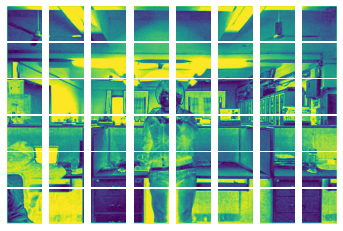

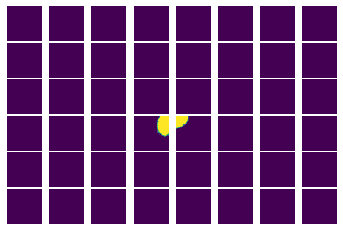

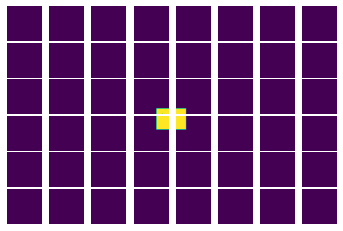

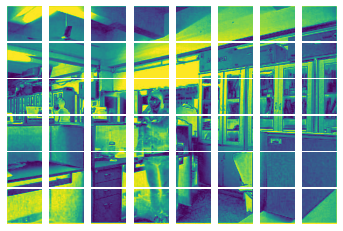

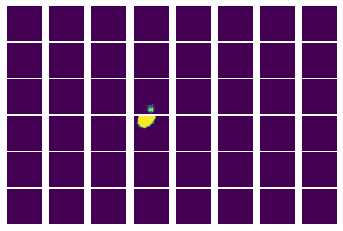

...

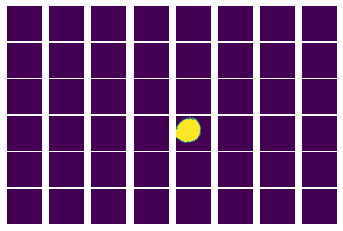

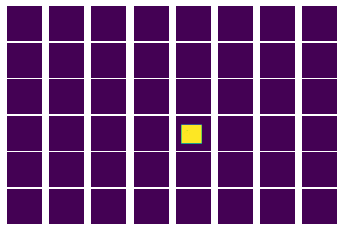

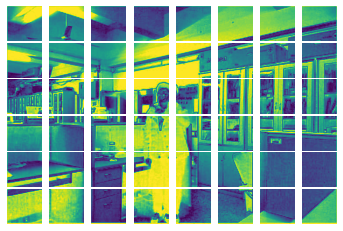

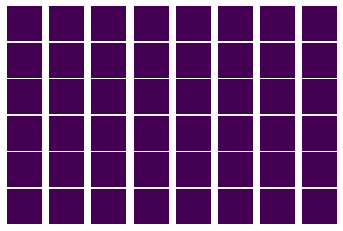

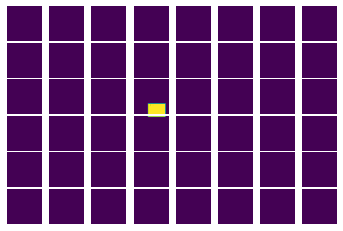

In [21]:
visualize_model_output(loader_test, resnet18, 10, TILE_HEIGHT=80, TILE_WIDTH=80, device='cuda')

torch.Size([10, 3, 48, 80, 80]) torch.Size([10, 3, 48, 80, 80])
tensor(0.9942) tensor(0.5473) tensor(0.3407)


C:\Users\gorde\AppData\Local\Temp/ipykernel_8208/2167702001.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(v, h)


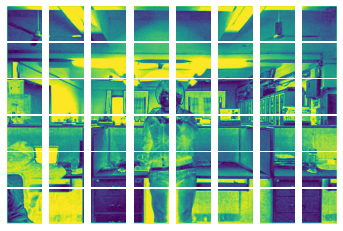

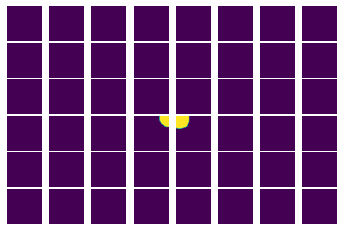

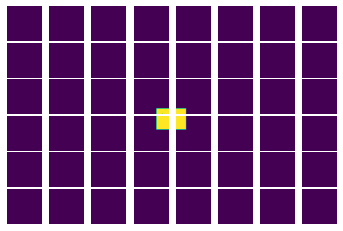

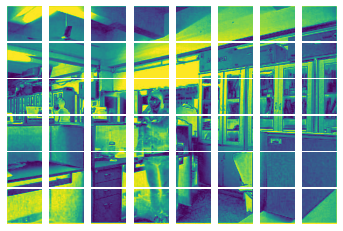

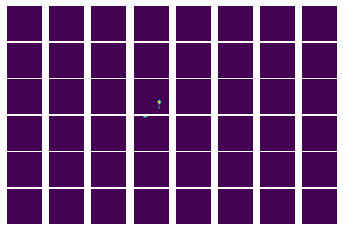

...

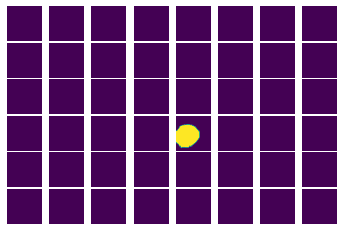

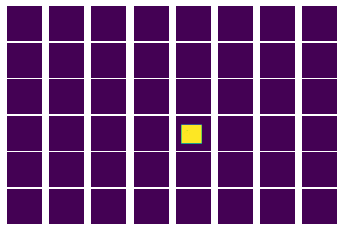

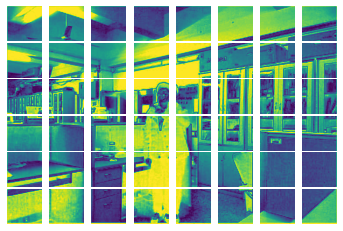

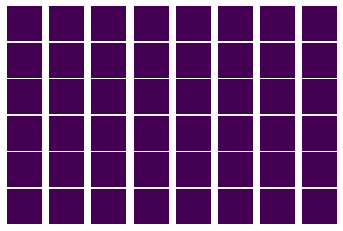

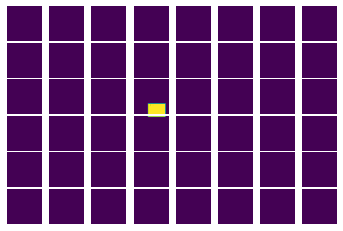

In [19]:
visualize_model_output(loader_test, mobilenet, 10, TILE_HEIGHT=80, TILE_WIDTH=80, device='cuda')